In [32]:
import pandas as pd
pd.options.display.max_columns = 50

pd.options.mode.chained_assignment = None 

import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px # Instalation : https://plotly.com/python/getting-started/, also check the jupyterlab extra guide.

# Data reading and Preprocessing

In [33]:
df = pd.read_csv('LUCAS-SOIL-2018-v2/LUCAS-SOIL-2018.csv')

country_codes = pd.read_html('https://www.iban.com/country-codes')[0]
country_mapping = dict(zip(country_codes['Alpha-2 code'],country_codes['Country']))


From the readme file, this is the rule about CaCO3 

For the field CaCO3:
- If CaCO3 is absent (value=0) and pH<7; then we  put the value NA in the CSV
- If CaCO3 is absent (value=0) and pH>=7; then we  put the value <LOD in the CSV
- If CaCO3 is not absent (value <> 0) then we just put the value, which will be >=1 (as there are no values >0 and <1

Why????
For now i will replace every < LOD to 0

**Question : Will it give negative effect for the analysis if I just assume things below LOD = 0 ?**

In [34]:
# Encode -1 for < LOD
df['CaCO3'] = df['CaCO3'].replace("<  LOD",-1).astype(float)
df['OC'] = df['OC'].replace("< LOD",-1).replace("<0.0",0).astype(float)

df['P']=df['P'].replace("< LOD",-1).replace("<0.0",0).astype(float)
df['N']=df['N'].replace("< LOD",-1).replace("<0.0",0).astype(float)
df['K']=df['K'].replace("< LOD",-1).replace("<0.0",0).astype(float)

In [35]:
country_codes = pd.read_html('https://en.wikipedia.org/wiki/Nomenclature_of_Territorial_Units_for_Statistics')[0]['Countries']
country_codes.columns = ['country','code']
country_mapping = dict(zip(country_codes['code'],country_codes['country']))
country_mapping['EL'] = 'Greece'
country_mapping['UK'] = 'United Kingdom'

df['COUNTRY'] = df['NUTS_0'].map(country_mapping)

# Ph Data

**Based on Mikolaj explanation, pH_CaCl2 pH_H2O is pH measurement using different buffer solutions.**

After cross checking with the readme file, it seems correct

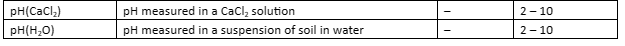

2-10 is the range of the value
## pH Comparison
pH always measured in everypoint, except for this particular location (not sure why) : 

In [36]:
df[(df['pH_H2O'].isna()) | (df['pH_CaCl2'].isna())]

,Depth,POINTID,pH_CaCl2,pH_H2O,EC,OC,CaCO3,P,N,K,OC (20-30 cm),CaCO3 (20-30 cm),Ox_Al,Ox_Fe,NUTS_0,NUTS_1,NUTS_2,NUTS_3,TH_LAT,TH_LONG,SURVEY_DATE,Elev,LC,LU,LC0_Desc,LC1_Desc,LU1_Desc,COUNTRY
15503,20-30 cm,27021938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.8,NaN,NaN,NaN,PT,PT1,PT17,PT170,38.727108,-8.708952,09-07-18,106,C10,U120,Woodland,Broadleaved woodland,Forestry,Portugal


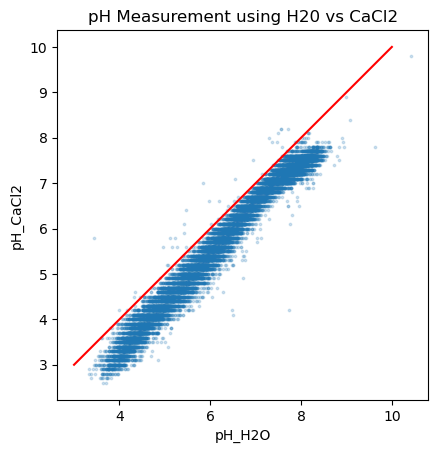

In [37]:
ax = df.plot(x='pH_H2O',y='pH_CaCl2',kind='scatter',alpha=0.2,s=3,title='pH Measurement using H20 vs CaCl2')
plt.plot((3,10),(3,10),c='red')

ax.set_aspect('equal', adjustable='box')

In [38]:
df[['pH_H2O','pH_CaCl2']].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
pH_H2O,18983.0,6.259460,1.319465,3.34,5.12,6.29,7.5,10.43
pH_CaCl2,18983.0,5.706427,1.398586,2.60,4.50,5.80,7.1,9.80


insight : Most of the observation is below the reference ref line, meaning that pH measured using H20 is giving higher reading around 0.5 that pH measured using CaCl2

There is some data point with extreme difference, let's take a look at them

In [39]:
df['pH_difference'] = abs(df['pH_CaCl2'] - df['pH_H2O'])
df.sort_values('pH_difference',ascending=False).iloc[:5]

,Depth,POINTID,pH_CaCl2,pH_H2O,EC,OC,CaCO3,P,N,K,OC (20-30 cm),CaCO3 (20-30 cm),Ox_Al,Ox_Fe,NUTS_0,NUTS_1,NUTS_2,NUTS_3,TH_LAT,TH_LONG,SURVEY_DATE,Elev,LC,LU,LC0_Desc,LC1_Desc,LU1_Desc,COUNTRY,pH_difference
15845,0-20 cm,54902630,4.2,7.73,16.72,24.2,1.0,6.1,2.7,85.0,NaN,NaN,NaN,NaN,RO,RO1,RO12,RO122,45.709550,25.110116,05-12-18,615,D20,U420,Shrubland,Shrubland without tree cover,Semi-natural and natural areas not in use,Romania,3.53
10697,0-20 cm,37782618,4.1,6.49,17.24,50.2,NaN,125.0,4.8,658.5,NaN,NaN,NaN,NaN,FR,FRK,FRK1,FRK11,46.442455,2.929060,21-07-18,365,E20,U111,Grassland,Grassland without tree/shrub cover,Agriculture (excluding fallow land and kitchen...,France,2.39
18351,0-20 cm,49782822,5.8,3.43,18.87,14.4,NaN,19.4,1.8,239.0,NaN,NaN,NaN,NaN,SK,SK0,SK02,SK023,48.156607,18.850706,08-06-18,164,B11,U111,Cropland,Common wheat,Agriculture (excluding fallow land and kitchen...,Slovakia,2.37
10863,0-20 cm,38682528,4.2,6.47,25.41,18.4,NaN,31.6,2.3,171.0,NaN,NaN,NaN,NaN,FR,FRK,FRK2,FRK25,45.705365,4.184205,04-06-18,379,B16,U111,Cropland,Maize,Agriculture (excluding fallow land and kitchen...,France,2.27
15009,0-20 cm,51763344,4.9,6.73,17.45,22.1,NaN,53.8,2.4,118.0,NaN,NaN,NaN,NaN,PL,PL8,PL84,PL842,52.532352,22.673290,25-09-18,178,B16,U111,Cropland,Maize,Agriculture (excluding fallow land and kitchen...,Poland,1.83


Insight : At extreme case, pH can differs by 3.53.

## pH per country

<Axes: xlabel='pH_CaCl2', ylabel='COUNTRY'>

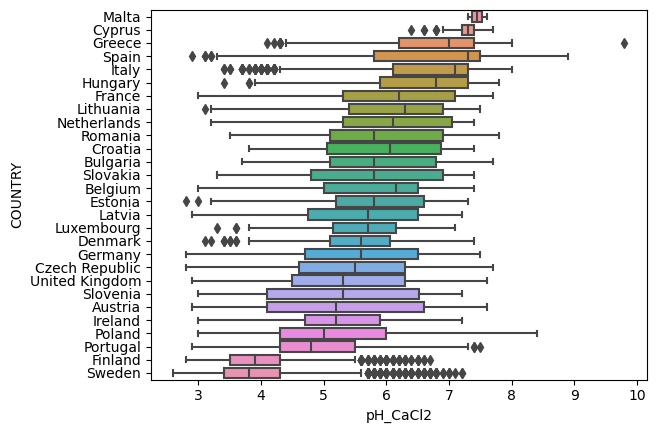

In [40]:
sns.boxplot(y='COUNTRY',x='pH_CaCl2',data=df,order=df.groupby('COUNTRY')['pH_CaCl2'].mean().sort_values(ascending=False).index)
# Every country have wide range of pH except for Malta, Cyprus. They are super Alkaline
# Sweden and Finland is super acidic for some reason.

## pH by Land Usage

<Axes: xlabel='pH_CaCl2', ylabel='LU1_Desc'>

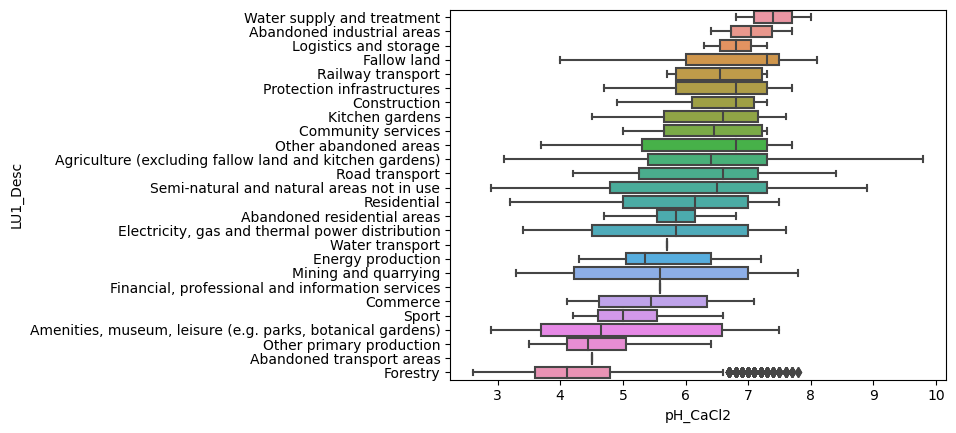

In [41]:
sns.boxplot(y='LU1_Desc',x='pH_CaCl2',data=df,order=df.groupby('LU1_Desc')['pH_CaCl2'].mean().sort_values(ascending=False).index)
# The measurement is more stable.
# The water treatment area is a bit alkaline 
# Forestry is very acidic
# The Agriculture have pretty wide possible values (isn't this weird???)

## Extreme pH measurement

### Super Acidic place
Speaking about extreme, lets see what kind of place which super low pH measurement

In [42]:
df.sort_values('pH_CaCl2').head()

,Depth,POINTID,pH_CaCl2,pH_H2O,EC,OC,CaCO3,P,N,K,OC (20-30 cm),CaCO3 (20-30 cm),Ox_Al,Ox_Fe,NUTS_0,NUTS_1,NUTS_2,NUTS_3,TH_LAT,TH_LONG,SURVEY_DATE,Elev,LC,LU,LC0_Desc,LC1_Desc,LU1_Desc,COUNTRY,pH_difference
16592,0-20 cm,45463782,2.6,3.71,8.41,524.5,3.0,38.5,16.5,111.2,NaN,NaN,NaN,NaN,SE,SE2,SE21,SE211,57.088155,13.709050,11-08-18,109,C32,U120,Woodland,Pine dominated mixed woodland,Forestry,Sweden,1.11
16664,0-20 cm,46103852,2.6,3.64,9.42,479.3,5.0,35.1,11.3,335.6,NaN,NaN,NaN,NaN,SE,SE2,SE21,SE211,57.681816,14.842256,27-09-18,209,C22,U120,Woodland,Pine dominated coniferous woodland,Forestry,Sweden,1.04
16819,0-20 cm,45603698,2.7,3.57,14.76,141.9,1.0,21.4,5.1,103.8,NaN,NaN,NaN,NaN,SE,SE2,SE22,SE224,56.327690,13.862423,26-07-18,56,C21,U120,Woodland,Spruce dominated coniferous woodland,Forestry,Sweden,0.87
16611,0-20 cm,45603778,2.7,3.72,22.90,329.6,3.0,38.2,10.7,181.3,NaN,NaN,NaN,NaN,SE,SE2,SE21,SE211,57.045545,13.935649,11-08-18,120,C21,U120,Woodland,Spruce dominated coniferous woodland,Forestry,Sweden,1.02
16684,0-20 cm,46303856,2.7,3.63,14.87,497.4,NaN,40.2,12.3,468.8,NaN,NaN,NaN,NaN,SE,SE2,SE21,SE211,57.705080,15.181297,25-09-18,309,C22,U120,Woodland,Pine dominated coniferous woodland,Forestry,Sweden,0.93


Sweden dominating list of countries with extreme acid soil condition, let's see which other countries have super low pH condition as well :

In [43]:
df.query('pH_CaCl2<3')[['COUNTRY','LU1_Desc']].value_counts()

COUNTRY         LU1_Desc                                                  
Sweden          Forestry                                                      59
Finland         Forestry                                                      21
Austria         Forestry                                                       4
Germany         Forestry                                                       4
Sweden          Semi-natural and natural areas not in use                      4
Czech Republic  Forestry                                                       3
Latvia          Forestry                                                       2
Estonia         Forestry                                                       1
Latvia          Semi-natural and natural areas not in use                      1
Portugal        Forestry                                                       1
Spain           Forestry                                                       1
Sweden          Amenities, museum,

When filtering country with pH < 3, sweden is the most dominating one, followed by Finland.  
This is the location with the lowest pH https://www.google.com/maps/@57.088155,13.70905,13z?entry=ttu 

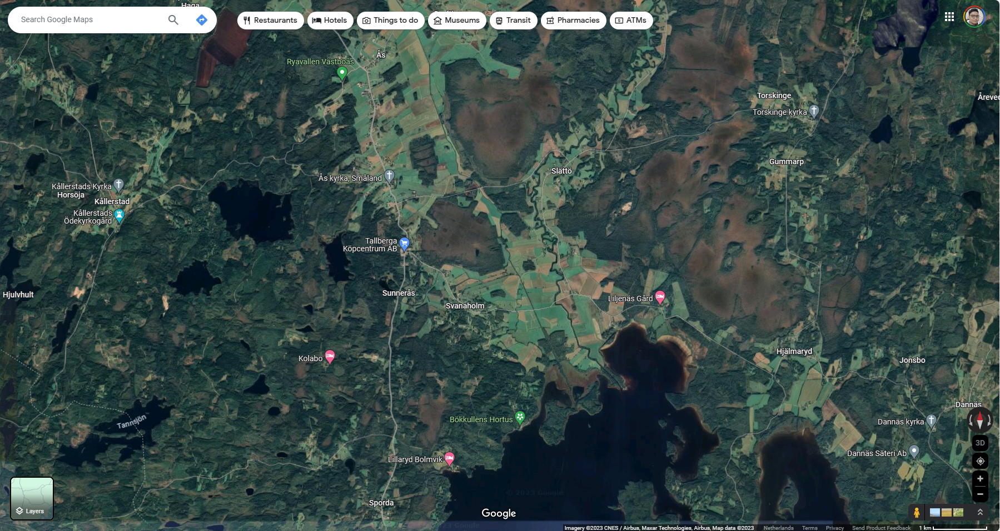

### Super Alkaline Place
Now let's do the opposite

In [44]:
df.sort_values('pH_CaCl2',ascending=False).head() 

,Depth,POINTID,pH_CaCl2,pH_H2O,EC,OC,CaCO3,P,N,K,OC (20-30 cm),CaCO3 (20-30 cm),Ox_Al,Ox_Fe,NUTS_0,NUTS_1,NUTS_2,NUTS_3,TH_LAT,TH_LONG,SURVEY_DATE,Elev,LC,LU,LC0_Desc,LC1_Desc,LU1_Desc,COUNTRY,pH_difference
2960,0-20 cm,54022060,9.8,10.43,138.46,4.1,8.0,11.2,0.7,247.1,NaN,NaN,NaN,NaN,EL,EL5,EL52,EL522,40.812043,22.822904,09-05-18,94,B55,U111,Cropland,Temporary grassland,Agriculture (excluding fallow land and kitchen...,Greece,0.63
3878,0-20 cm,33462196,8.9,8.99,1295.60,4.0,165.0,-1.0,0.7,90.2,NaN,NaN,NaN,NaN,ES,ES2,ES23,ES230,42.178754,-1.814881,20-07-18,359,D20,U420,Shrubland,Shrubland without tree cover,Semi-natural and natural areas not in use,Spain,0.09
15060,0-20 cm,50783306,8.4,9.07,27.80,6.3,52.0,27.0,0.4,153.2,NaN,NaN,NaN,NaN,PL,PL9,PL91,PL912,52.339860,21.157146,25-06-18,124,E30,U312,Grassland,Spontaneously re-vegetated surfaces,Road transport,Poland,0.67
6025,0-20 cm,32241920,8.2,7.56,17.28,5.5,371.0,36.0,0.7,235.0,NaN,NaN,NaN,NaN,ES,ES4,ES42,ES423,39.540717,-2.756238,24-07-18,767,B13,U111,Cropland,Barley,Agriculture (excluding fallow land and kitchen...,Spain,0.64
5988,0-20 cm,32161908,8.2,7.71,23.59,8.2,180.0,32.7,1.0,437.3,NaN,NaN,NaN,NaN,ES,ES4,ES42,ES423,39.421600,-2.826610,24-04-18,736,B82,U111,Cropland,Vineyards,Agriculture (excluding fallow land and kitchen...,Spain,0.49


There is a single place in Greece with super alkaline soil. Not sure what cause them   
Here is the location : https://www.google.com/maps/@40.812043,22.822904,14z?entry=ttu

Maybe that lake is cursed :/
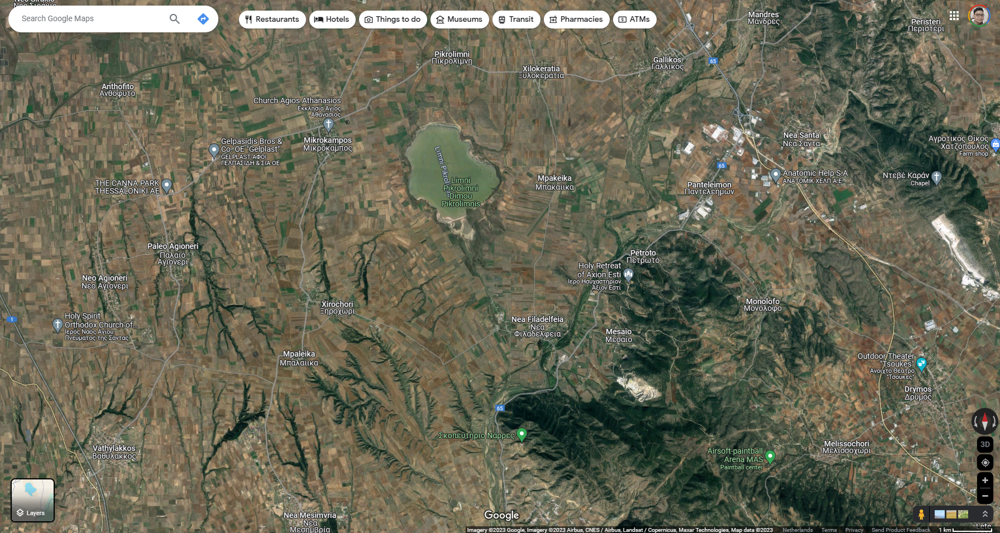

## List of the insights in this section about pH : 
- There is fundamental difference between pH measured using H2O and CaCl2 which H2O will give higher result
- Only 1 place where pH measured different drastically.
- Soil in Sweden and Finland is super acidic
- Soil in Malta and Cyprus is super alkaline
- The most acidic pH taken in south of Sweden https://www.google.com/maps/@57.088155,13.70905,13z?entry=ttu
- The most alkaline pH taken somewhere in greece https://www.google.com/maps/@40.812043,22.822904,14z?entry=ttu
- Agriculture have very wide range of pH
- Forestry is mostly acidic

# Electrical Conductivity

its measured in mS/m  
Limit of detection is 0.1


## Missing Value Checking
Let's check the missing value first

In [45]:
df[df['EC'].isna()]

,Depth,POINTID,pH_CaCl2,pH_H2O,EC,OC,CaCO3,P,N,K,OC (20-30 cm),CaCO3 (20-30 cm),Ox_Al,Ox_Fe,NUTS_0,NUTS_1,NUTS_2,NUTS_3,TH_LAT,TH_LONG,SURVEY_DATE,Elev,LC,LU,LC0_Desc,LC1_Desc,LU1_Desc,COUNTRY,pH_difference
12423,0-20 cm,42061926,5.3,6.20,NaN,32.2,NaN,-1.0,3.0,177.1,NaN,NaN,NaN,NaN,IT,ITG,ITG2,ITG25,40.420997,8.651472,24-05-18,456,E20,U111,Grassland,Grassland without tree/shrub cover,Agriculture (excluding fallow land and kitchen...,Italy,0.90
12990,0-20 cm,45582066,6.4,6.90,NaN,21.2,NaN,48.6,2.2,1090.1,NaN,NaN,NaN,NaN,IT,ITI,ITI4,ITI44,41.656196,12.835031,13-05-18,227,E20,U111,Grassland,Grassland without tree/shrub cover,Agriculture (excluding fallow land and kitchen...,Italy,0.50
14244,0-10 cm,47444748,3.3,4.14,NaN,390.2,NaN,157.9,9.5,232.1,NaN,NaN,NaN,NaN,SE,SE3,SE33,SE332,65.591466,19.134089,11-07-18,400,C33,U120,Woodland,Other mixed woodland,Forestry,Sweden,0.84
15241,0-10 cm,48304850,3.6,4.51,NaN,425.9,NaN,28.2,11.4,464.7,NaN,NaN,NaN,NaN,SE,SE3,SE33,SE332,66.387417,21.350654,02-09-18,235,C22,U420,Woodland,Pine dominated coniferous woodland,Semi-natural and natural areas not in use,Sweden,0.91
15503,20-30 cm,27021938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.8,NaN,NaN,NaN,PT,PT1,PT17,PT170,38.727108,-8.708952,09-07-18,106,C10,U120,Woodland,Broadleaved woodland,Forestry,Portugal,NaN
17091,0-20 cm,44604016,3.1,3.78,NaN,437.3,1.0,35.2,12.7,237.0,NaN,NaN,NaN,NaN,SE,SE3,SE31,SE311,59.223417,12.429603,17-10-18,143,C32,U120,Woodland,Pine dominated mixed woodland,Forestry,Sweden,0.68
17452,0-20 cm,45164476,3.7,4.84,NaN,460.1,NaN,71.8,19.1,486.9,NaN,NaN,NaN,NaN,SE,SE3,SE32,SE322,63.338830,13.875855,17-07-18,399,C21,U120,Woodland,Spruce dominated coniferous woodland,Forestry,Sweden,1.14
17814,0-20 cm,47024684,4.1,4.85,NaN,443.4,NaN,15.6,18.6,420.8,NaN,NaN,NaN,NaN,SE,SE3,SE33,SE331,65.065316,18.062724,15-09-18,345,C33,U120,Woodland,Other mixed woodland,Forestry,Sweden,0.75
17818,0-20 cm,47044660,3.0,3.94,NaN,459.5,NaN,45.5,11.7,335.9,NaN,NaN,NaN,NaN,SE,SE3,SE33,SE331,64.848249,18.041283,13-09-18,267,C22,U120,Woodland,Pine dominated coniferous woodland,Forestry,Sweden,0.94


Only 9 instances of POINTID don't have the EC, and mostly dominated by Sweden (What's wrong with you)

## Descriptive Statistics
Let's calculate statistics descriptive

In [46]:
df['EC'].describe(percentiles=[0.05,0.10,0.25,0.5,0.75,0.9,0.95,0.975,0.99]).to_frame().transpose()

,count,mean,std,min,5%,10%,25%,50%,75%,90%,95%,97.5%,99%,max
EC,18975.0,18.389964,25.56063,0.24,3.817,4.99,8.095,13.95,20.6,31.46,44.065,60.7125,101.8,1295.6


We can see there is a whopping outlier with value over 30x the P-95 of the EC

## Soil with "normal" EC measurement

<Axes: ylabel='Frequency'>

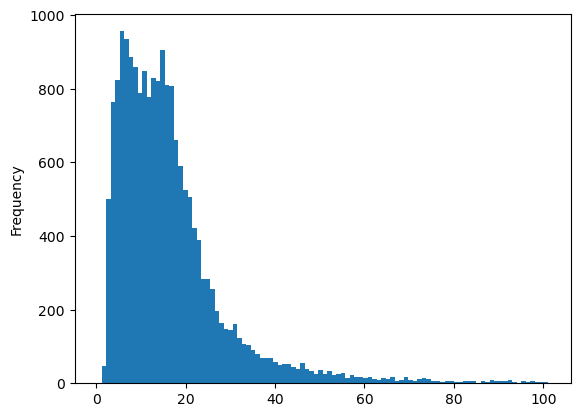

In [47]:
df_normal_EC = df[df['EC']<df['EC'].quantile(0.99)]
df_normal_EC['EC'].plot(kind='hist',bins=100)

Most soil have EC <20.  Nothing interesting to be observed here

### EC by country

<Axes: xlabel='EC', ylabel='COUNTRY'>

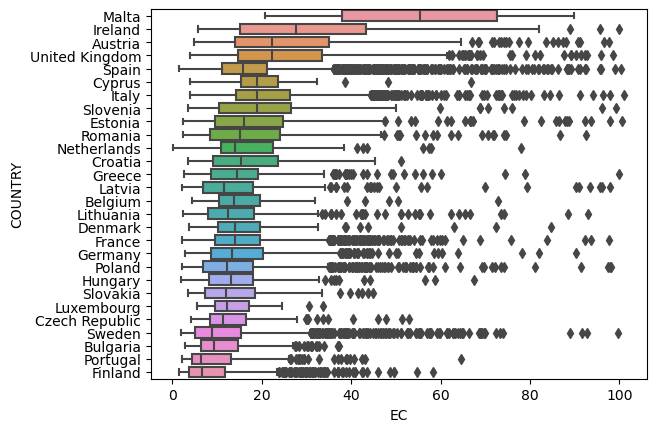

In [48]:
sns.boxplot(y='COUNTRY',x='EC',data=df_normal_EC,order=df.groupby('COUNTRY')['EC'].mean().sort_values(ascending=False).index)
# Not sure if there is anything worth mentioning here

### EC by Land Usage

<Axes: xlabel='EC', ylabel='LU1_Desc'>

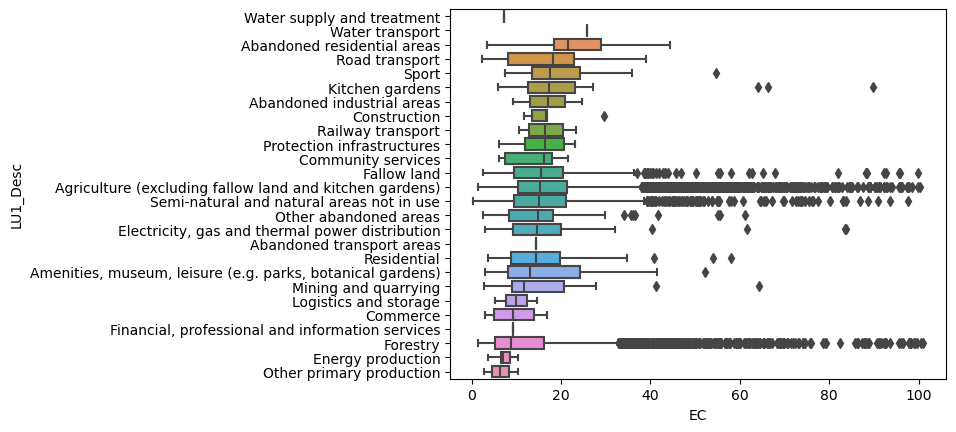

In [49]:
sns.boxplot(y='LU1_Desc',x='EC',data=df_normal_EC,order=df.groupby('LU1_Desc')['EC'].median().sort_values(ascending=False).index)
# The places with high EC are Forestry, Agriculture, Semi-natural and natural areas not in use and then fallow land 

### EC vs pH

,pH_CaCl2,pH_H2O,EC
pH_CaCl2,1.000000,0.987105,0.276866
pH_H2O,0.987105,1.000000,0.220580
EC,0.276866,0.220580,1.000000


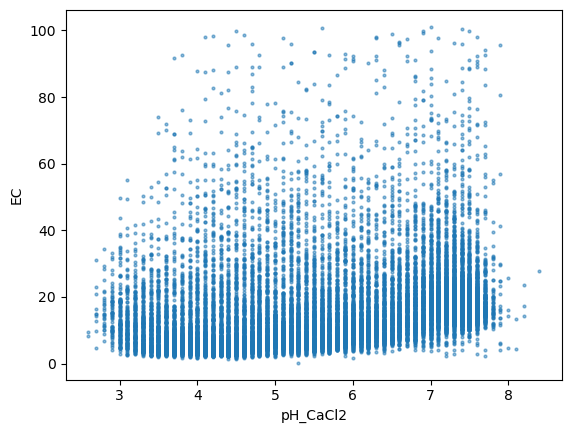

In [50]:
df_normal_EC.plot(x='pH_CaCl2',y='EC',kind='scatter',s=4,alpha=0.5)
df_normal_EC[['pH_CaCl2','pH_H2O','EC']].corr()
# There is weak correlation between pH and EC?

Let see if there is any statistical correlation when the pH is high or low with the EC

In [51]:
print('number of data point with pH > 7.5: ',df_normal_EC.query('pH_CaCl2<7.5').shape[0])
df_normal_EC.query('pH_CaCl2>7.5')[['pH_CaCl2','pH_H2O','EC']].corr()

number of data point with pH > 7.5:  17037


,pH_CaCl2,pH_H2O,EC
pH_CaCl2,1.000000,0.152949,0.049675
pH_H2O,0.152949,1.000000,-0.191984
EC,0.049675,-0.191984,1.000000


In [52]:
print('number of data point with pH < 6.5: ',df_normal_EC.query('pH_CaCl2<6.5').shape[0])
df_normal_EC.query('pH_CaCl2<6.5')[['pH_CaCl2','pH_H2O','EC']].corr()

number of data point with pH < 6.5:  11767


,pH_CaCl2,pH_H2O,EC
pH_CaCl2,1.000000,0.971015,0.133261
pH_H2O,0.971015,1.000000,0.032068
EC,0.133261,0.032068,1.000000


In alkaline condition, EC and pH_H20 have weak negative correlation  
In acidic condition, EC and pH_CaCl2 have weak positive correlation  
Is this the science behind it, or just coincident?

## Soil with "extreme" EC measurement

In [53]:
df['is_high_EC'] = df['EC']>=df['EC'].quantile(0.99)
df['is_high_EC'].sum()
# 191 place have very high EC content

191

In [54]:
# Top 5 places with highest EC
df.query('is_high_EC').sort_values('EC',ascending=False).head()

,Depth,POINTID,pH_CaCl2,pH_H2O,EC,OC,CaCO3,P,N,K,OC (20-30 cm),CaCO3 (20-30 cm),Ox_Al,Ox_Fe,NUTS_0,NUTS_1,NUTS_2,NUTS_3,TH_LAT,TH_LONG,SURVEY_DATE,Elev,LC,LU,LC0_Desc,LC1_Desc,LU1_Desc,COUNTRY,pH_difference,is_high_EC
3878,0-20 cm,33462196,8.9,8.99,1295.60,4.0,165.0,-1.0,0.7,90.2,NaN,NaN,NaN,NaN,ES,ES2,ES23,ES230,42.178754,-1.814881,20-07-18,359,D20,U420,Shrubland,Shrubland without tree cover,Semi-natural and natural areas not in use,Spain,0.09,True
3775,0-20 cm,33522182,8.1,8.18,556.16,10.1,297.0,-1.0,1.2,139.5,NaN,NaN,NaN,NaN,ES,ES2,ES22,ES220,42.062446,-1.718778,20-07-18,371,E20,U420,Grassland,Grassland without tree/shrub cover,Semi-natural and natural areas not in use,Spain,0.08,True
3790,0-20 cm,33622176,8.0,8.15,553.18,9.4,297.0,-1.0,1.1,156.3,NaN,NaN,NaN,NaN,ES,ES2,ES22,ES220,42.022887,-1.589123,20-07-18,366,F40,U112,Bareland,Other bare soil,Fallow land,Spain,0.15,True
11762,0-20 cm,32583496,5.2,5.31,526.54,72.5,NaN,98.5,6.6,921.9,NaN,NaN,NaN,NaN,IE,IE0,IE06,IE061,53.497955,-6.171716,29-05-18,7,E20,U111,Grassland,Grassland without tree/shrub cover,Agriculture (excluding fallow land and kitchen...,Ireland,0.11,True
3208,0-20 cm,53001774,7.7,7.91,439.98,13.4,159.0,-1.0,1.6,228.4,NaN,NaN,NaN,NaN,EL,EL6,EL63,EL631,38.403013,21.176725,27-05-18,23,B52,U111,Cropland,Lucerne,Agriculture (excluding fallow land and kitchen...,Greece,0.21,True


Let's see if there is any chemical property which make them extremely high

In [57]:
df_temp = df.copy()[['is_high_EC','pH_CaCl2','pH_H2O','OC','CaCO3','N','P','K']].replace(-1,np.nan)
df_temp.groupby('is_high_EC').mean().sort_index(ascending=False)
# Place with very high EC have very high : OC, N and K

,pH_CaCl2,pH_H2O,OC,CaCO3,N,P,K
is_high_EC,,,,,,,
True,6.992147,7.163770,80.885789,248.951807,5.986911,36.699259,352.531053
False,5.693359,6.250268,47.263166,93.918206,3.125796,34.699379,202.956471


## List of Insight about EC : 
- No clear relationship between EC and pH
- High EC characterized with higher amount of OC, N and K
- The places with high EC are Forestry, Agriculture, Semi-natural and natural areas not in use and then fallow land 

# OC and CaCO3

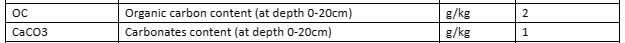

Basically it means for every kilogram of soil, how many gram we can found the OC / CaCO3
## Missing Value Analysis

In [62]:
# Missing Value
df[['EC','CaCO3']].isna().sum()

# Significant number of data point don't have CaCO3 recorded

EC          9
CaCO3    7763
dtype: int64

In [68]:
df['is_missing_CaCO3'] = df['CaCO3'].isna()

In [73]:
# Top 5 countries with highest missing CaCO3 measurement
df.groupby(['COUNTRY'])['is_missing_CaCO3'].mean().sort_values(ascending=False).head()

# Not sure why they don't measure it in these countries. I also check the proportion by LC1,LU1 and Survey_Date but can't find any explanation. 

COUNTRY
Denmark           0.807018
United Kingdom    0.705653
Ireland           0.671329
Poland            0.640988
Czech Republic    0.640449
Name: is_missing_CaCO3, dtype: float64

In [64]:
# Value below LOD
(df[['EC','CaCO3']]==-1).sum()

# Not really significant

EC       0
CaCO3    9
dtype: int64

## Descriptive Statistics

In [95]:
df[['OC','CaCO3']].replace(-1,np.nan).describe(percentiles=[0.05,0.10,0.25,0.5,0.6,0.75,0.9,0.95,0.975,0.99]).transpose()

# For OC, I think values 0 - p-90 is kinda "not high", more than p-90 is very different than others
# For CaCO3, I think values 0 - p=60 is kinda "not high", there is sudden jump at p-75.

,count,mean,std,min,5%,10%,25%,50%,60%,75%,90%,95%,97.5%,99%,max
OC,18951.0,47.600261,81.648029,0.0,6.85,8.9,13.1,21.8,27.6,42.7,91.7,180.25,376.525,476.85,723.9
CaCO3,11212.0,96.213566,164.632163,1.0,1.00,1.0,1.0,5.0,19.0,123.0,353.0,480.00,582.000,678.00,926.0


## OC and CaCO3 by LU

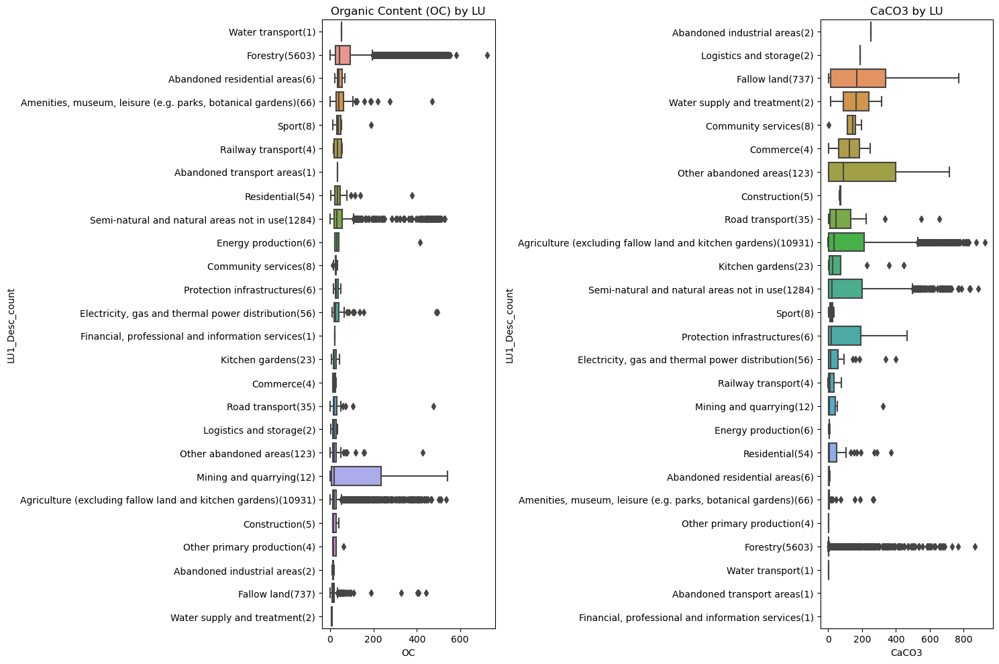

In [284]:
# I put COUNT of instances after the name. e.g : Forestry(5603) means there are 5603 data points for Forestry 

df['LU1_Desc_count'] = df['LU1_Desc'] + "(" + df['LU1_Desc'].map(df['LU1_Desc'].value_counts()).astype(str) + ")"

fig,ax = plt.subplots(1,2,figsize=(15,10))
sns.boxplot(y='LU1_Desc_count',x='OC',data=df,order=df.groupby('LU1_Desc_count')['OC'].median().sort_values(ascending=False).index,ax=ax[0]).set_title('Organic Content (OC) by LU')
sns.boxplot(y='LU1_Desc_count',x='CaCO3',data=df,order=df.groupby('LU1_Desc_count')['CaCO3'].median().sort_values(ascending=False).index,ax=ax[1]).set_title('CaCO3 by LU')
plt.tight_layout()
# I'm not sure if there is anything interesting here

## OC and CaCO3 by LC

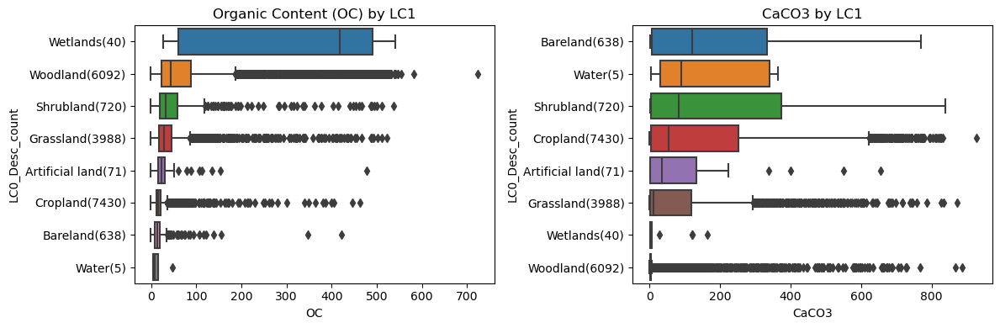

In [283]:
df['LC0_Desc_count'] = df['LC0_Desc'] + "(" + df['LC0_Desc'].map(df['LC0_Desc'].value_counts()).astype(str) + ")"

fig,ax = plt.subplots(1,2,figsize=(12,4))
sns.boxplot(y='LC0_Desc_count',x='OC',data=df,order=df.groupby('LC0_Desc_count')['OC'].median().sort_values(ascending=False).index,ax=ax[0]).set_title('Organic Content (OC) by LC1')
sns.boxplot(y='LC0_Desc_count',x='CaCO3',data=df,order=df.groupby('LC0_Desc_count')['CaCO3'].median().sort_values(ascending=False).index,ax=ax[1]).set_title('CaCO3 by LC1')
plt.tight_layout()

# Wetlands have high OC
# 

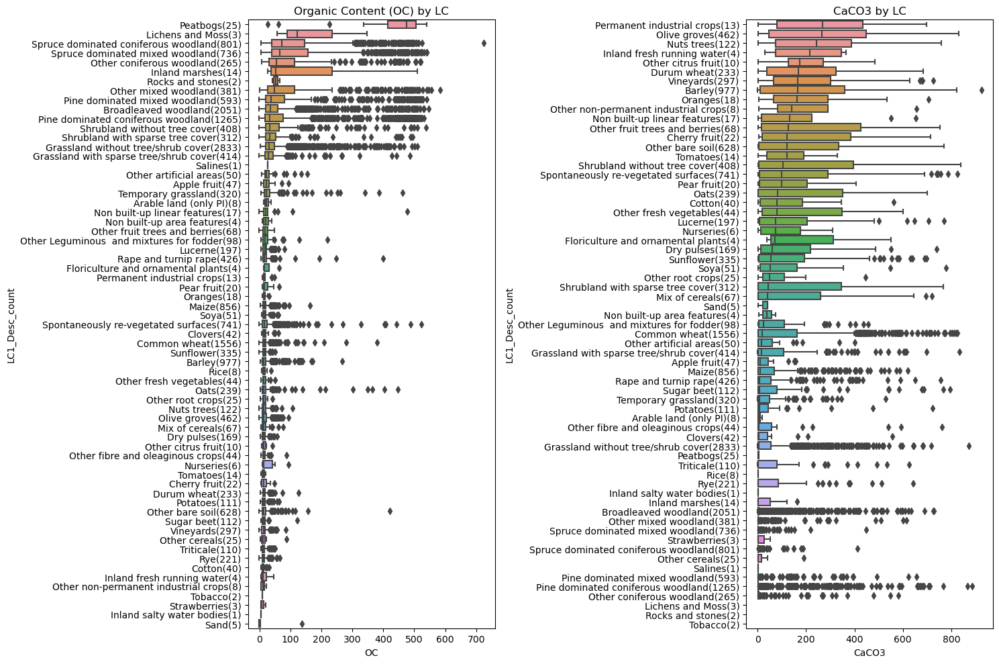

In [282]:
# I put COUNT of instances after the name. e.g : Peatbogs(25) means there are 25 data points for Peatbogs 
df['LC1_Desc_count'] = df['LC1_Desc'] + "(" + df['LC1_Desc'].map(df['LC1_Desc'].value_counts()).astype(str) + ")"

fig,ax = plt.subplots(1,2,figsize=(15,10))
sns.boxplot(y='LC1_Desc_count',x='OC',data=df,order=df.groupby('LC1_Desc_count')['OC'].median().sort_values(ascending=False).index,ax=ax[0]).set_title('Organic Content (OC) by LC')
sns.boxplot(y='LC1_Desc_count',x='CaCO3',data=df,order=df.groupby('LC1_Desc_count')['CaCO3'].median().sort_values(ascending=False).index,ax=ax[1]).set_title('CaCO3 by LC')
plt.tight_layout()

# Woodland, Grassland and Marshes have higher OC content, while crops have lower OC
# For EC its almost the exact opposite
# It seems there is negative relationship between OC and CaCO3

## OC vs CaCO3

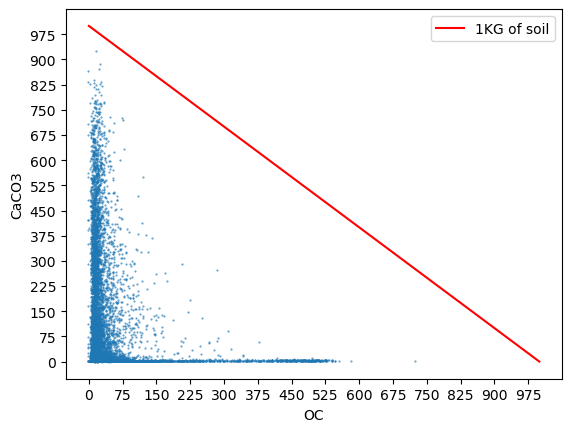

In [158]:
ax = df.plot(x='OC',y='CaCO3',kind='scatter',s=0.3,alpha=0.7)
plt.plot((0,1000),(1000,0),c='red',label='1KG of soil') 
ax.set_xticks(np.arange(0,1000,75))
ax.set_yticks(np.arange(0,1000,75));
plt.legend()

# It is possible for a 1kg of soil to have almost 900gr of CaCO3
# For OC, the highest limit is almost 500 gram
# When OC is > ~80, the CaCO3 content cannot be high (you can reverse the argument by saying when CaCO3 > 50, OC content tends to be pretty low)

In [164]:
df[['pH_CaCl2','pH_H2O','EC','OC','CaCO3']].corr()[['OC','CaCO3']]
# CaCO3 have positive correlation with pH which is pretty expected since CaCO3 is very alkaline
# I don't remember much about organic chemistry but i remember some stuff like CH3COOH is acidic

# Let's validate it with some visualization

,OC,CaCO3
pH_CaCl2,-0.390688,0.489973
pH_H2O,-0.389164,0.506623
EC,0.127105,0.165906
OC,1.000000,-0.171543
CaCO3,-0.171543,1.000000


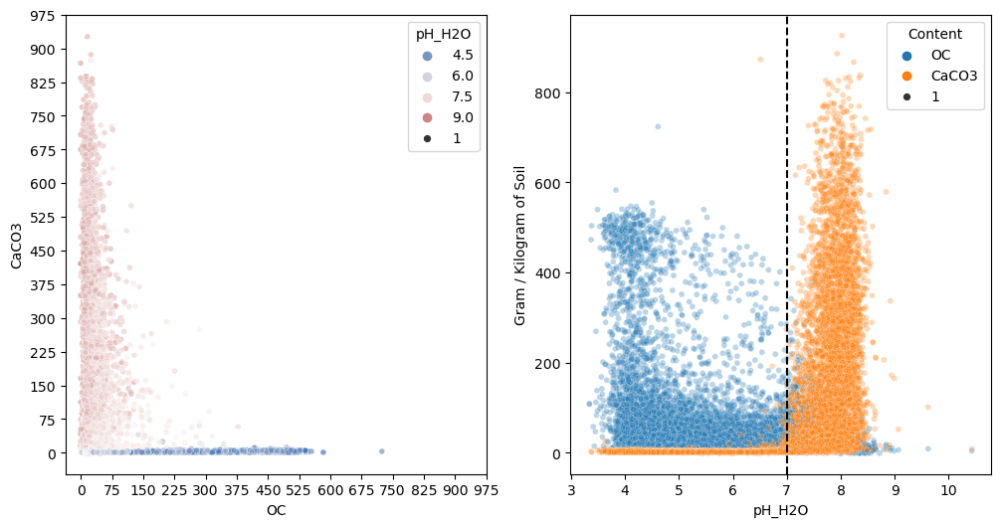

In [223]:
# Making 2 plot of OC, CaCO3 and pH
fig,ax = plt.subplots(1,2,figsize=(12,6))

cmap = sns.color_palette("vlag", as_cmap=True)
sns.scatterplot(x='OC',y='CaCO3',hue='pH_H2O',data=df,size=1,alpha=0.7,palette=cmap,ax=ax[0])
ax[0].set_xticks(np.arange(0,1000,75));
ax[0].set_yticks(np.arange(0,1000,75));

df_plot = df[['pH_H2O','OC','CaCO3']].set_index('pH_H2O').melt(ignore_index=False,var_name='Content').reset_index()
sns.scatterplot(data=df_plot,x='pH_H2O',y='value',hue='Content',size=1,alpha=0.3,ax=ax[1])
ax[1].set_ylabel('Gram / Kilogram of Soil')
ax[1].axvline(7,label='neutral', linestyle='--',c='black')

# The plots justify the hyphotesis that high CaCO3 will create alkalize soil while high OC will create acidic soil

# NPK

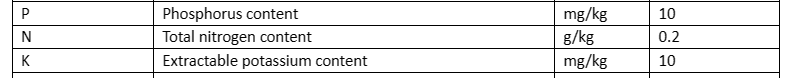

Some have different unit. 

## Missing Value Analysis

In [230]:
df[['N','P','K']].isna().sum()
# There are few instances of missing value

N     1
P    26
K     1
dtype: int64

In [231]:
# Reminder than i encode -1 as < LOD
(df[['N','P','K']]==-1).sum()

# Tons of P have value < LOD (reminder we got 19K datapoints)

N      14
P    4976
K      39
dtype: int64

## Descriptive Statistics

In [247]:
df[['N','P','K']].replace(-1,np.nan).describe(percentiles=[0.05,0.10,0.25,0.5,0.6,0.75,0.9,0.95,0.975,0.99]).transpose()

,count,mean,std,min,5%,10%,25%,50%,60%,75%,90%,95%,97.5%,99%,max
N,18969.0,3.154605,3.716608,0.2,0.7,0.9,1.3,2.0,2.4,3.4,6.00,9.800,15.3000,20.900,46.5
P,13982.0,34.718688,27.547459,0.0,10.8,12.1,16.6,26.5,32.0,44.0,67.40,84.400,104.5425,130.676,515.0
K,18944.0,204.456638,207.069427,6.2,33.7,48.4,85.0,153.0,187.3,261.0,409.57,534.885,666.2275,888.041,7578.8


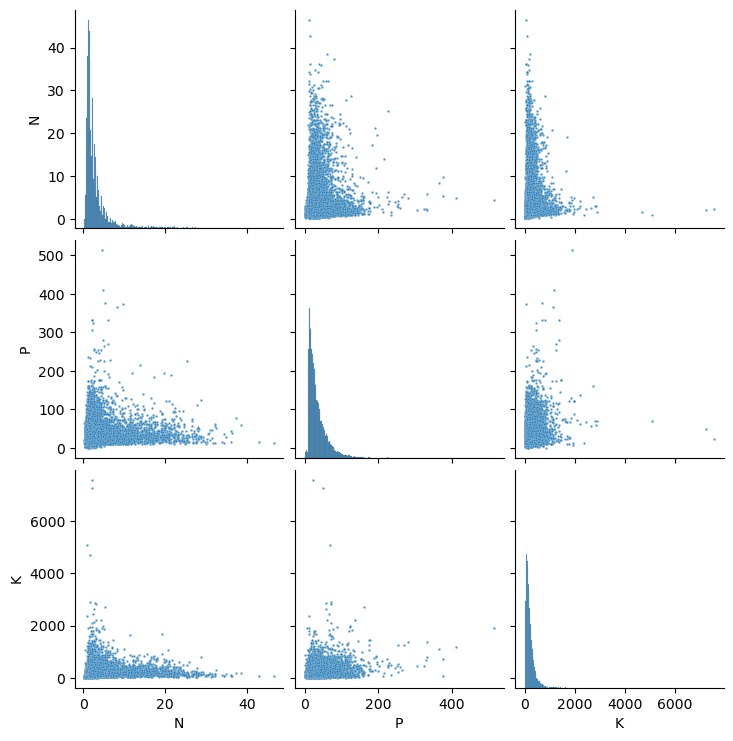

In [263]:
sns.pairplot(df[['N','P','K']].replace(-1,np.nan),plot_kws={"s": 3,'alpha':0.8})

# There is hardly any relationship can be seen between N,P and K

There should be somekind of ratio we can derive from ratio of N-P-K but I'm not sure how to do it

In [271]:
df.replace(-1,np.nan).groupby(['LC0_Desc'])[['N','P','K']].mean().sort_values('P',ascending=False)
# Not sure if there is anything interesting here

,N,P,K
LC0_Desc,,,
Cropland,1.836490,39.093073,251.307579
Artificial land,2.890141,37.363830,200.146479
Grassland,3.617946,34.488268,207.152987
Bareland,1.631467,34.220916,243.241536
Water,0.600000,29.300000,55.220000
Shrubland,3.682754,28.589677,219.653819
Woodland,4.491152,28.283949,139.503764
Wetlands,13.762500,25.356757,206.930000


In [273]:
df.replace(-1,np.nan).groupby(['LU1_Desc'])[['N','P','K']].mean().sort_values('P',ascending=False)
# Not sure if there is anything interesting here

,N,P,K
LU1_Desc,,,
Abandoned residential areas,3.616667,75.325000,303.433333
Kitchen gardens,2.156522,58.929412,347.078261
Protection infrastructures,2.333333,49.300000,186.933333
Residential,3.235185,48.256098,233.670370
Sport,3.862500,45.371429,153.537500
Commerce,1.750000,43.275000,142.850000
Water transport,5.400000,42.800000,93.400000
Other abandoned areas,2.239837,40.756164,261.516260
"Amenities, museum, leisure (e.g. parks, botanical gardens)",4.253846,38.701786,177.280303


## Extreme Value Analysis

In [287]:
df.sort_values('K',ascending=False).head()
# Top places with highest K concentration, not sure if there is a pattern, maybe K added on purpose ?

,Depth,POINTID,pH_CaCl2,pH_H2O,EC,OC,CaCO3,P,N,K,OC (20-30 cm),CaCO3 (20-30 cm),Ox_Al,Ox_Fe,NUTS_0,NUTS_1,NUTS_2,NUTS_3,TH_LAT,TH_LONG,SURVEY_DATE,Elev,LC,LU,LC0_Desc,LC1_Desc,LU1_Desc,COUNTRY,pH_difference,is_high_EC,is_missing_CaCO3,LC1_Desc_count,LU1_Desc_count,LC0_Desc_count
12892,0-20 cm,44682182,6.1,6.70,10.92,20.7,NaN,22.6,2.2,7578.8,NaN,NaN,NaN,NaN,IT,ITI,ITI1,ITI1A,42.728541,11.789530,08-07-18,512,E30,U112,Grassland,Spontaneously re-vegetated surfaces,Fallow land,Italy,0.60,False,True,Spontaneously re-vegetated surfaces(741),Fallow land(737),Grassland(3988)
12969,0-20 cm,44882158,6.8,7.02,32.16,25.1,1.0,49.6,2.1,7242.6,NaN,NaN,NaN,NaN,IT,ITI,ITI4,ITI41,42.507308,12.025568,17-07-18,491,E30,U112,Grassland,Spontaneously re-vegetated surfaces,Fallow land,Italy,0.22,False,False,Spontaneously re-vegetated surfaces(741),Fallow land(737),Grassland(3988)
12977,0-20 cm,45122134,5.8,6.63,16.53,5.4,NaN,69.6,0.8,5093.1,NaN,NaN,1.7,2.3,IT,ITI,ITI4,ITI41,42.284399,12.308209,14-05-18,293,B74,U111,Cropland,Nuts trees,Agriculture (excluding fallow land and kitchen...,Italy,0.83,False,True,Nuts trees(122),Agriculture (excluding fallow land and kitchen...,Cropland(7430)
1111,0-20 cm,55882170,4.9,5.66,6.54,27.0,NaN,-1.0,1.5,4679.6,NaN,NaN,NaN,NaN,BG,BG4,BG42,BG425,41.476969,25.224552,19-08-18,760,C32,U120,Woodland,Pine dominated mixed woodland,Forestry,Bulgaria,0.76,False,True,Pine dominated mixed woodland(593),Forestry(5603),Woodland(6092)
12100,0-20 cm,46742002,6.9,7.62,25.54,13.2,1.0,70.8,1.6,2893.3,NaN,NaN,0.6,1.8,IT,ITF,ITF3,ITF31,41.029617,14.181568,23-06-18,62,B43,U111,Cropland,Other fresh vegetables,Agriculture (excluding fallow land and kitchen...,Italy,0.72,False,False,Other fresh vegetables(44),Agriculture (excluding fallow land and kitchen...,Cropland(7430)


# Presence of Al and FE 

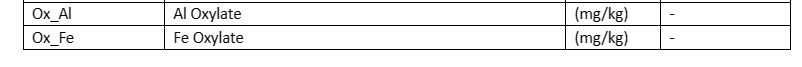

There is only few records about these 2 measurement

In [350]:
df_ox = df.query('~Ox_Al.isna()')

<Axes: xlabel='Ox_Al', ylabel='Ox_Fe'>

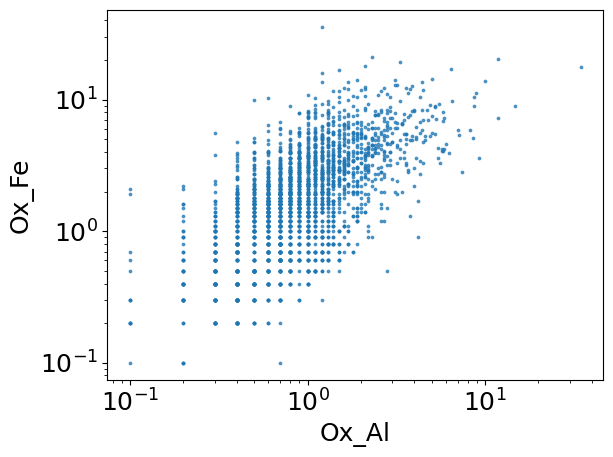

In [365]:
df_ox.plot(kind='scatter',x='Ox_Al',y='Ox_Fe',logx=True,logy=True, alpha=0.7,s=3) # Logarthicmic Plot
# There is logarthimic relationship between Ox_AL and Ox_FE

In [370]:
df_ox[['Ox_Al','Ox_Fe']].corr(method='spearman') # 60% Spearman correlation.

,Ox_Al,Ox_Fe
Ox_Al,1.00000,0.61276
Ox_Fe,0.61276,1.00000


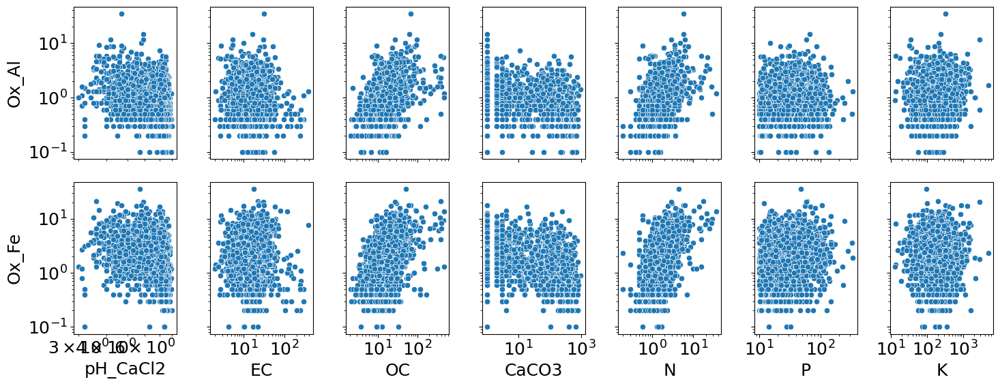

In [383]:
fig,ax = plt.subplots(2,7,figsize=(15,6),sharey='row',sharex='col')
for idx,col in enumerate(['pH_CaCl2','EC','OC','CaCO3','N','P','K']) :
    sns.scatterplot(data=df_ox,y='Ox_Al',x=col,ax=ax[0,idx])
    sns.scatterplot(data=df_ox,y='Ox_Fe',x=col,ax=ax[1,idx])
    ax[0,idx].set(xscale="log",yscale='log')
    ax[1,idx].set(xscale="log",yscale='log')
    
plt.tight_layout()

#The scatter plot show some hint of relationship between the Oxalate with OC and N

In [387]:
df[['Ox_Al','Ox_Fe','pH_CaCl2','EC','OC','CaCO3','N','P','K']].corr(method='spearman').loc[['Ox_Al','Ox_Fe']]
# The spearman correlation also confirm the relationship between Ox_Al, Ox_Fe and OC

,Ox_Al,Ox_Fe,pH_CaCl2,EC,OC,CaCO3,N,P,K
Ox_Al,1.00000,0.61276,-0.264550,-0.043160,0.458270,-0.249149,0.426394,0.097055,0.067524
Ox_Fe,0.61276,1.00000,-0.458897,-0.090539,0.399284,-0.507168,0.429368,0.251738,-0.077549


In [406]:
df[['Ox_Al','Ox_Fe','pH_CaCl2','EC','OC','CaCO3','N','P','K']].corr(method='pearson').loc[['Ox_Al','Ox_Fe']]

,Ox_Al,Ox_Fe,pH_CaCl2,EC,OC,CaCO3,N,P,K
Ox_Al,1.000000,0.515174,-0.246886,-0.031823,0.242689,-0.201704,0.266948,0.032263,0.101753
Ox_Fe,0.515174,1.000000,-0.309646,-0.007328,0.330766,-0.342911,0.413627,0.137536,0.034463


# Some CoolStuff

Just trying out random things and see if any could give something

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed on the [6] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[4]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 with loadings.


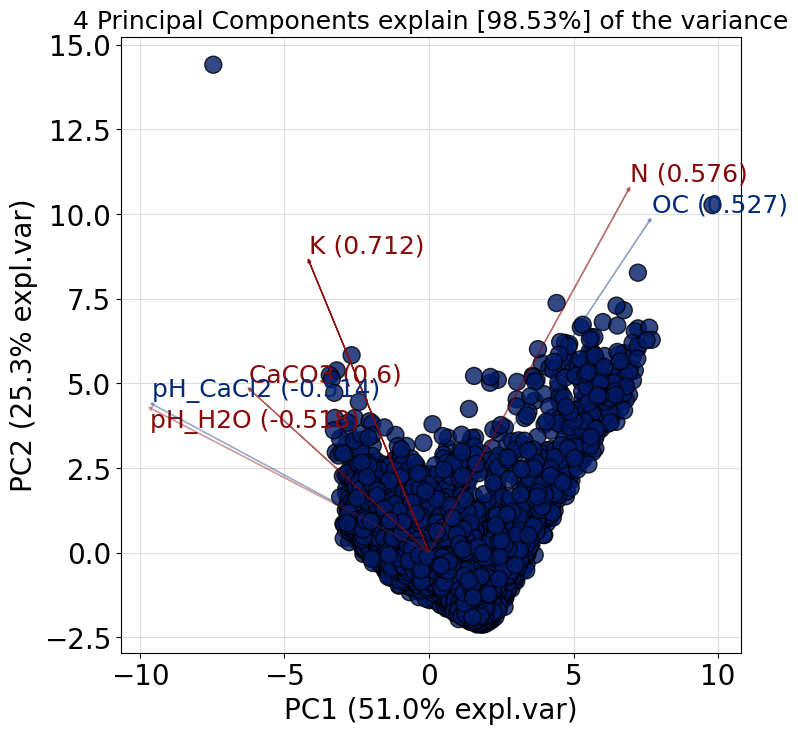

In [348]:
from pca import pca
model = pca(n_components=4)

df_pca = df[['N','K','pH_H2O','pH_CaCl2','OC','CaCO3']].dropna()# Remove P because tons of missing value and EC because it seems not too relevant
df_pca = df_pca.replace(-1,0)

scaler = StandardScaler()

df_pca_cols = df_pca.columns
df_pca2 = scaler.fit_transform(df_pca)
df_pca2 = pd.DataFrame(df_pca2,columns=df_pca_cols)
# Fit and transform
results = model.fit_transform(X=df_pca2)

# Create a biplot
fig, ax = model.biplot()
fig.set_size_inches((8, 8))

# Insight : N and OC is near orthogonal to K, pH and CaCO3. Orthogonal mean the feature have near zero correlation. 
# Feature with similar direction mean they have similar characteristic (soil with high N also have high OC)

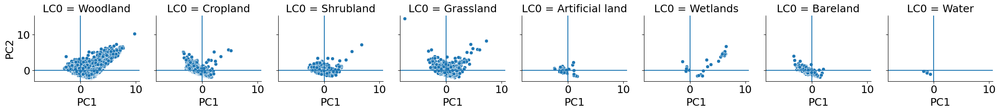

In [405]:
pca_result = results['PC']
df_pca['LC0'] = df_pca.index.map(df['LC0_Desc'])
df_pca_plot = pd.concat([pca_result,df_pca.reset_index()],axis=1)
g = sns.FacetGrid(df_pca_plot, col="LC0")
g.map_dataframe(sns.scatterplot,x='PC1',y='PC2')
for ax in g.axes_dict.values():
    ax.axvline(0)
    ax.axhline(0)
    
# Insight : Cropland, grassland and bareland are similar, but woodland is kind the opposite of the three

# Raw Lucas Data

In [407]:
df_raw = pd.read_csv('EU_2018_20200213.CSV')

C:\Users\vinso\AppData\Local\Temp\ipykernel_15908\436217498.py:1: DtypeWarning:

Columns (0,32) have mixed types. Specify dtype option on import or set low_memory=False.



In [409]:
df_raw.columns

Index(['POINT_ID', 'NUTS0', 'NUTS1', 'NUTS2', 'NUTS3', 'TH_LAT', 'TH_LONG',
       'OFFICE_PI', 'EX_ANTE', 'SURVEY_DATE', 'CAR_LATITUDE', 'CAR_EW',
       'CAR_LONGITUDE', 'GPS_PROJ', 'GPS_PREC', 'GPS_ALTITUDE', 'GPS_LAT',
       'GPS_EW', 'GPS_LONG', 'OBS_DIST', 'OBS_DIRECT', 'OBS_TYPE', 'LC1',
       'LC1_SPEC', 'LC1_PERC', 'LC2', 'LC2_SPEC', 'LC2_PERC', 'LU1',
       'LU1_TYPE', 'LU1_PERC', 'LU2', 'LU2_TYPE', 'LU2_PERC', 'PARCEL_AREA_HA',
       'TREE_HEIGHT_SURVEY', 'TREE_HEIGHT_MATURITY', 'FEATURE_WIDTH',
       'LNDMNG_PLOUGH', 'LM_PLOUGH_SLOPE', 'LM_PLOUGH_DIRECT',
       'LM_STONE_WALLS', 'CROP_RESIDUES', 'LM_GRASS_MARGINS', 'GRAZING',
       'SPECIAL_STATUS', 'LC_LU_SPECIAL_REMARK', 'CPRN_CANDO', 'CPRN_LC',
       'CPRN_LC1N', 'CPRNC_LC1E', 'CPRNC_LC1S', 'CPRNC_LC1W',
       'CPRN_LC1N_BRDTH', 'CPRN_LC1E_BRDTH', 'CPRN_LC1S_BRDTH',
       'CPRN_LC1W_BRDTH', 'CPRN_LC1N_NEXT', 'CPRN_LC1E_NEXT', 'CPRN_LC1S_NEXT',
       'CPRN_LC1W_NEXT', 'CPRN_URBAN', 'CPRN_IMPERVIOUS_PERC', 'INSP

In [415]:
pd.options.display.max_columns = 100

In [417]:
df_raw

,POINT_ID,NUTS0,NUTS1,NUTS2,NUTS3,TH_LAT,TH_LONG,OFFICE_PI,EX_ANTE,SURVEY_DATE,CAR_LATITUDE,CAR_EW,CAR_LONGITUDE,GPS_PROJ,GPS_PREC,GPS_ALTITUDE,GPS_LAT,GPS_EW,GPS_LONG,OBS_DIST,OBS_DIRECT,OBS_TYPE,LC1,LC1_SPEC,LC1_PERC,LC2,LC2_SPEC,LC2_PERC,LU1,LU1_TYPE,LU1_PERC,LU2,LU2_TYPE,LU2_PERC,PARCEL_AREA_HA,TREE_HEIGHT_SURVEY,TREE_HEIGHT_MATURITY,FEATURE_WIDTH,LNDMNG_PLOUGH,LM_PLOUGH_SLOPE,LM_PLOUGH_DIRECT,LM_STONE_WALLS,CROP_RESIDUES,LM_GRASS_MARGINS,GRAZING,SPECIAL_STATUS,LC_LU_SPECIAL_REMARK,CPRN_CANDO,CPRN_LC,CPRN_LC1N,CPRNC_LC1E,CPRNC_LC1S,CPRNC_LC1W,CPRN_LC1N_BRDTH,CPRN_LC1E_BRDTH,CPRN_LC1S_BRDTH,CPRN_LC1W_BRDTH,CPRN_LC1N_NEXT,CPRN_LC1E_NEXT,CPRN_LC1S_NEXT,CPRN_LC1W_NEXT,CPRN_URBAN,CPRN_IMPERVIOUS_PERC,INSPIRE_PLCC1,INSPIRE_PLCC2,INSPIRE_PLCC3,INSPIRE_PLCC4,INSPIRE_PLCC5,INSPIRE_PLCC6,INSPIRE_PLCC7,INSPIRE_PLCC8,EUNIS_COMPLEX,GRASSLAND_SAMPLE,GRASS_CANDO,WM,WM_SOURCE,WM_TYPE,WM_DELIVERY,EROSION_CANDO,SOIL_STONES_PERC,BIO_SAMPLE,SOIL_BIO_TAKEN,BULK0_10_SAMPLE,SOIL_BLK_0_10_TAKEN,BULK10_20_SAMPLE,SOIL_BLK_10_20_TAKEN,BULK20_30_SAMPLE,SOIL_BLK_20_30_TAKEN,STANDARD_SAMPLE,SOIL_STD_TAKEN,ORGANIC_SAMPLE,SOIL_ORG_DEPTH_CANDO,PHOTO_POINT,PHOTO_NORTH,PHOTO_EAST,PHOTO_SOUTH,PHOTO_WEST
0,53482684,RO,RO1,RO12,RO121,46.430171,23.431046,0.0,0.0,20/08/18,46.431714,1.0,23.433006,1.0,6.0,506.0,46.430180,1.0,23.431062,1.0,1.0,1.0,E20,8,100.0,8,8,0.0,U111,8,100.0,8,8,0.0,3.0,8.0,8.0,8.0,2.0,8.0,8.0,1.0,2.0,1.0,2.0,4.0,1.0,8.0,8,88.0,88.0,88.0,88.0,888.0,888.0,888.0,888.0,8,8,8,8,2.0,0.0,0.0,5.0,5.0,90.0,0.0,0.0,0.0,0.0,88.0,0.0,8.0,5.0,8.0,8.0,8.0,8.0,888.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,1.0,1.0,1.0,1.0,1.0
1,53482708,RO,RO1,RO11,RO113,46.642239,23.485417,0.0,0.0,20/09/18,46.642473,1.0,23.484648,1.0,3.0,10599.0,46.642233,1.0,23.485412,0.0,1.0,1.0,E20,8,100.0,8,8,0.0,U111,8,100.0,8,8,0.0,4.0,8.0,8.0,8.0,2.0,8.0,8.0,1.0,2.0,1.0,2.0,4.0,10.0,1.0,E2,51.0,51.0,51.0,51.0,888.0,888.0,888.0,888.0,8,8,8,8,2.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,88.0,0.0,8.0,3.0,8.0,8.0,8.0,8.0,888.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,1.0,1.0,1.0,1.0,1.0
2,53482780,RO,RO1,RO11,RO116,47.278047,23.651941,0.0,0.0,19/11/18,47.277468,1.0,23.654118,1.0,4.0,211.0,47.278057,1.0,23.651970,2.0,1.0,1.0,B16,8,80.0,E30,8,20.0,U111,8,100.0,8,8,0.0,4.0,8.0,8.0,8.0,1.0,1.0,3.0,1.0,1.0,1.0,2.0,4.0,10.0,1.0,B1,51.0,51.0,51.0,51.0,888.0,888.0,888.0,888.0,8,8,8,8,2.0,0.0,0.0,0.0,0.0,20.0,0.0,0.0,0.0,80.0,88.0,0.0,8.0,5.0,8.0,8.0,8.0,8.0,888.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,1.0,1.0,1.0,1.0,1.0
3,53482806,RO,RO1,RO11,RO114,47.507499,23.713364,0.0,0.0,06/10/18,47.507226,1.0,23.711799,1.0,4.0,271.0,47.507290,1.0,23.712103,97.0,1.0,3.0,E20,8,100.0,8,8,0.0,U111,8,100.0,8,8,0.0,3.0,8.0,8.0,8.0,2.0,8.0,8.0,1.0,2.0,1.0,2.0,4.0,10.0,8.0,8,88.0,88.0,88.0,88.0,888.0,888.0,888.0,888.0,8,8,8,8,2.0,888.0,0.0,0.0,4.0,96.0,0.0,0.0,0.0,0.0,88.0,0.0,8.0,5.0,8.0,8.0,8.0,8.0,0.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,1.0,8.0,0.0,8.0,2.0,1.0,1.0,1.0,1.0
4,53483768,LV,LV0,LV00,LV005,55.942103,26.596329,0.0,0.0,04/07/18,55.941830,1.0,26.597150,1.0,2.0,125.0,55.942310,1.0,26.596300,23.0,1.0,1.0,A12,8,100.0,8,8,0.0,U370,8,100.0,8,8,0.0,1.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,2.0,4.0,10.0,8.0,8,88.0,88.0,88.0,88.0,888.0,888.0,888.0,888.0,8,8,8,8,2.0,50.0,888.0,888.0,888.0,888.0,888.0,888.0,888.0,888.0,88.0,0.0,8.0,8.0,8.0,8.0,8.0,8.0,888.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,0.0,8.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
337850,45083172,DE,DED,DED5,DED53,51.627364,12.701203,0.0,0.0,17/07/18,51.628573,1.0,12.701744,1.0,16.0,145.0,51.627344,1.0,12.701232,3.0,1.0,1.0,C32,C322,100.0,8,8,0.0,U120,8,100.0,8,8,0.0,5.